# Setup

#### Imports

In [2]:
"""Normal estimation"""
ROOT_DIR = "/home/user/Documents/projects/Metaworld"

import sys
sys.path.append(ROOT_DIR)

%matplotlib widget  
import argparse
import gc
import os
import json
import random
from PIL import Image
from typing import Dict, List, Union

import cv2
import numpy as np

import gc
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import PILToTensor
import torch.nn as nn
import numpy as np
import torch.nn.functional as F
from scipy.spatial.transform import Rotation as R
import importlib
from typing import List
from easydict import EasyDict as edict
from tqdm import tqdm

# visualization
import plotly.express as px
import plotly.graph_objects as go
from lightglue import viz2d
from einops import rearrange

import open3d as o3d
from open3d.web_visualizer import draw

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
[Open3D INFO] Resetting default logger to print to terminal.


In [3]:
from keyframes.align_ft_spair import dataset
from keyframes.align_ft_spair.utils import geo_utils, spair_utils, ft_align_utils, depth_match_utils, geom_utils, img_utils
from keyframes.align_ft_spair import pl_modules
from keyframes.align_ft_spair.ext import projection_network, utils_correspondence, utils_dataset
from utils import torch_utils

#### Data

In [4]:
# params
spair_data_folder="/media/user/ssd2t/datasets2/SPair-71k"
embds_folder_geo="/media/user/EXTREMESSD/datasets/SPair-71k/geo"
embds_folder_sd="/media/user/EXTREMESSD/datasets/SPair-71k/DiffusionFeatures60x60"
img_files_np_path_train="/home/user/Documents/projects/diffusion-features/experiments/ft_align/aeroplane_train_files_unique.npy"
img_files_np_path_eval="/home/user/Documents/projects/diffusion-features/experiments/ft_align/aeroplane_eval_files_unique.npy"
depth_folder = "/media/user/EXTREMESSD/datasets/SPair-71k/miragold"
# kpt_indices=[3, 4, 5]
category="aeroplane"
img_size=960
embd_size=60
pad=True

img_files_train = np.load(img_files_np_path_train).tolist()
img_files_eval = np.load(img_files_np_path_eval).tolist()

flips_train = [False]
flips_eval = [False]

In [5]:
# load embeddings
img_embds_train, img_embds_hat_train = geo_utils.load_geo_embds(
    img_files_train,
    embds_folder_dino=embds_folder_geo,
    embds_folder_sd=embds_folder_sd,
    flips=flips_train,
)
img_embds_train = img_embds_train.detach().cpu()
img_embds_hat_train = img_embds_hat_train.detach().cpu()

# load embeddings
img_embds_eval, img_embds_hat_eval = geo_utils.load_geo_embds(
    img_files_eval,
    embds_folder_dino=embds_folder_geo,
    embds_folder_sd=embds_folder_sd,
    flips=flips_eval,
)
img_embds_eval = img_embds_eval.detach().cpu()
img_embds_hat_eval = img_embds_hat_eval.detach().cpu()

# build kpt_idx_to_kpt_embds
kpt_idx_to_kpt_embds_train, kpt_embd_coords_train, kpt_img_coords_train = spair_utils.build_kpt_idx_to_kpt_embds(
    img_files=img_files_train,
    img_embds_hat=img_embds_hat_train,
    spair_data_folder=spair_data_folder,
    img_size=img_size,
    embd_size=embd_size,
    pad=pad,
    flips=flips_train
)
kpt_idx_to_kpt_embds_eval, kpt_embd_coords_eval, kpt_img_coords_eval = spair_utils.build_kpt_idx_to_kpt_embds(
    img_files=img_files_eval,
    img_embds_hat=img_embds_hat_eval,
    spair_data_folder=spair_data_folder,
    img_size=img_size,
    embd_size=embd_size,
    pad=pad,
    flips=flips_eval
)

# average keypoint embeddings
kpt_features_avg_train = []
for kpt_index in range(30):
    kpt_features = kpt_idx_to_kpt_embds_train[kpt_index]
    if kpt_features is not None:
        kpt_features_avg_train.append(torch.mean(kpt_features, dim=0, keepdim=True))
kpt_features_avg_train = torch.cat(kpt_features_avg_train, dim=0)
# print(kpt_features_avg_train.shape)

# 1.1) load depth
depths_train = []
for img_file in img_files_train:
    fn = os.path.basename(img_file).split(".")[0]
    depth_file = f"{depth_folder}/{category}/depth_npy/{fn}_pred.npy"
    depth = np.load(depth_file)
    # NOTE instead of resizing depth we will resize and upscale attentions
    depths_train.append(depth)

depths_eval = []
for img_file in img_files_eval:
    fn = os.path.basename(img_file).split(".")[0]
    depth_file = f"{depth_folder}/{category}/depth_npy/{fn}_pred.npy"
    depth = np.load(depth_file)
    depths_eval.append(depth)

# 1.3) reproject to point clouds
xyz_train = []
for depth in depths_train:
    v0 = geom_utils.reproject_depth(depth)
    xyz_train.append(v0)

xyz_eval = []
for depth in depths_eval:
    v0 = geom_utils.reproject_depth(depth)
    xyz_eval.append(v0)

# TODO save xyz

# px.imshow(depths_padded_resized_train[20])

In [6]:
# 1.4) normal estimation
# => see model global, match local

normals_train = []

# create point cloud
for xyz in tqdm(xyz_train):
    pcd = o3d.geometry.PointCloud()
    h, w = xyz.shape[:2]
    pcd.points = o3d.utility.Vector3dVector(xyz.reshape((-1, 3)))
    pcd.estimate_normals()
    pcd.orient_normals_towards_camera_location()
    normals = np.asarray(pcd.normals)
    normals_train.append(normals.reshape((h, w, 3)))

normals_eval = []
for xyz in tqdm(xyz_eval):
    pcd = o3d.geometry.PointCloud()
    h, w = xyz.shape[:2]
    pcd.points = o3d.utility.Vector3dVector(xyz.reshape((-1, 3)))
    pcd.estimate_normals()
    pcd.orient_normals_towards_camera_location()
    normals = np.asarray(pcd.normals)
    normals_eval.append(normals.reshape((h, w, 3)))

# TODO save normals

# viewer is much better than the one from plotly...
# draw(pcd_moving)

100%|██████████| 27/27 [00:04<00:00,  5.46it/s]


# Approach v5: Model of airplane with relative distances

=> stable points on symmetry plane don't have the spring break trough problem
=> Once stable points are recovered we can recover other points

In [7]:
# TODO
# 1) Extract xyz for all keypoints for each image
# 2) center box around mean of keypoints
# 3) Define energy function
# 4) recover other keypoints

In [8]:
# 1) Extract xyz for all keypoints for each image
# 1.1 we need 30x30 dist matrix for each image

In [9]:
kpt_xyz_with_indices = []
for i, coords in enumerate(kpt_img_coords_train):
    xyz_img = xyz_train[i]
    xyz_kpt = xyz_img[coords[:,1], coords[:,0]]
    kpt_xyz_with_indices.append(np.concatenate([xyz_kpt, coords[:,2][:,None]], axis=1))

kpt_dists = []
for i, xyz in enumerate(kpt_xyz_with_indices):
    xyz_all = np.zeros((30,3))
    xyz_all[xyz[:,3].astype(int),:] = xyz[:,:3]
    dists = np.linalg.norm(xyz_all[:,None,:3] - xyz_all[None,:,:3], axis=2)
    kpt_dists.append(dists)

# TODO we need angles and ratios


kpt_angles = []
kpt_ratios = []
for i, xyz in enumerate(kpt_xyz_with_indices):
    xyz_all = np.ones((30,3)) * np.nan
    xyz_all[xyz[:,3].astype(int),:] = xyz[:,:3]
    mask = np.all(~np.isnan(xyz_all), axis=1)
    angles = np.ones((30,30,30)) * np.nan
    ratios = np.ones((30,30,30)) * np.nan
    # TODO parallelize
    for j in range(30):
        for k in range(0, 30):
            for l in range(0, 30):
                if mask[j] and mask[k] and mask[l] and j != k and j != l and k != l:
                    v1 = xyz_all[k] - xyz_all[j]
                    v2 = xyz_all[l] - xyz_all[j]
                    angles[j,k,l] = np.arccos(np.dot(v1,v2) / (np.linalg.norm(v1) * np.linalg.norm(v2)))
                    ratios[j,k,l] = np.linalg.norm(v1) / (np.linalg.norm(v2))
    kpt_angles.append(angles)
    kpt_ratios.append(ratios)

In [10]:
all_kpt_angles = np.stack(kpt_angles, axis=0)
kpt_angles_mean = np.nanmean(all_kpt_angles, axis=0)
kpt_angles_std = np.nanstd(all_kpt_angles, axis=0)
all_kpt_ratios = np.stack(kpt_ratios, axis=0)
kpt_ratios_mean = np.nanmean(all_kpt_ratios, axis=0)
kpt_ratios_std = np.nanstd(all_kpt_ratios, axis=0)

/tmp/ipykernel_1434070/3257811208.py:2: RuntimeWarning: Mean of empty slice
  kpt_angles_mean = np.nanmean(all_kpt_angles, axis=0)
/home/user/anaconda3/envs/kf/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_1434070/3257811208.py:5: RuntimeWarning: Mean of empty slice
  kpt_ratios_mean = np.nanmean(all_kpt_ratios, axis=0)


In [11]:
def kpt_energy(
    xyz_candidates: torch.Tensor,
    kpts_xyz: torch.Tensor,
    # TODO we should also factor in uncertainty about kpt_xyz
    kpt_angles_mean: torch.Tensor,
    kpt_angles_std: torch.Tensor,
    kpt_ratios_mean: torch.Tensor,
    kpt_ratios_std: torch.Tensor
):
    """ computes total likelihood for each candidate
    Args:
        xyz_candidates: (N, 3)
        kpts_xyz: (30, 3)
        kpt_angles_mean: (30, 30, 30)
        kpt_angles_std: (30, 30, 30)
        kpt_ratios_mean: (30, 30, 30)
        kpt_ratios_std: (30, 30, 30)
    """
    n_c = xyz_candidates.shape[0]
    vec_cand_kpt = kpts_xyz[None,:,:] - xyz_candidates[:,None,:]  # (N, 30, 3)
    norms = torch.norm(vec_cand_kpt, dim=-1)  # (N, 30)
    dots =  torch.sum(vec_cand_kpt[:,:,None,:] * vec_cand_kpt[:,None,:,:], dim=-1)  # (N, 30, 30)
    angles = torch.zeros_like(dots)
    angles[:] = torch.nan
    ratios = torch.zeros_like(dots)
    ratios[:] = torch.nan
    mask = torch.all(~torch.isnan(kpts_xyz), dim=-1)  # (30,)
    mask2d = mask[None,:] * mask[:,None]  # (30, 30)
    norm_prods = norms[:,:,None] * norms[:,None,:]  # (N, 30, 30)
    angles[:,mask2d] = torch.acos(dots[:,mask2d] / (norm_prods[:,mask2d] + 1e-6))  # (N, 30, 30)
    ratios[:,mask2d] = (norms[:,mask,None] / (norms[:,None,mask] + 1e-6)).reshape(n_c, -1)  # (N, 30, 30)

    # likelihood
    # TODO make this more memory efficient
    #   - consider query kpt indices
    #   - apply masks
    likelihood_angles = (angles[:,None,:,:] - kpt_angles_mean[None,:,:,:]) / (kpt_angles_std[None,:,:,:] + 1e-6)   # (N, 30, 30, 30)
    likelihood_ratios = (ratios[:,None,:,:] - kpt_ratios_mean[None,:,:,:]) / (kpt_ratios_std[None,:,:,:] + 1e-6)   # (N, 30, 30, 30)
    likelihood_angles_mask = torch.isnan(likelihood_angles[0])
    likelihood_ratios_mask = torch.isnan(likelihood_ratios[0])
    likelihood_angles[:,likelihood_angles_mask] = 0
    likelihood_ratios[:,likelihood_ratios_mask] = 0
    total_log_likelihood_angle = torch.sum(torch.sum(-(likelihood_angles**2)/2, dim=-1), dim=-1)  # (N, 30)
    total_log_likelihood_ratio = torch.sum(torch.sum(-(likelihood_ratios**2)/2, dim=-1), dim=-1)  # (N, 30)

    total_length = torch.sum(torch.norm(vec_cand_kpt[:,mask,:], dim=-1), dim=-1)
    return total_log_likelihood_angle, total_log_likelihood_ratio, total_length, angles, ratios, mask


def kpt_energy_v2(
    xyz_candidates: torch.Tensor,
    kpts_xyz: torch.Tensor,
    # TODO we should also factor in uncertainty about kpt_xyz
    kpt_angles_mean: torch.Tensor,
    kpt_angles_std: torch.Tensor,
    kpt_ratios_mean: torch.Tensor,
    kpt_ratios_std: torch.Tensor,
    a: List[int],
    b: list[int]
):
    """ computes total likelihood for each candidate
    Args:
        xyz_candidates: (N, 3)
        kpts_xyz: (30, 3)
        kpt_angles_mean: (30, 30, 30)
        kpt_angles_std: (30, 30, 30)
        kpt_ratios_mean: (30, 30, 30)
        kpt_ratios_std: (30, 30, 30)
    """
    n_c = xyz_candidates.shape[0]

    # kpt_ratios_mean[i,k,l] ratio between (v_k - v_i) / (v_l - v_i) = r_ikl
    kpt_dists = torch.norm(kpts_xyz[:,None,:] - kpts_xyz[None,:,:], dim=-1)  # (30, 30) between vi and vl
    kpt_dists_target = kpt_ratios_mean * kpt_dists[:,None,:]  # (30, 30, 30) kpt_dists_target[i,k,l] = r_ikl * dist(v_i,v_l) = dist(v_k,v_i)_{given l}
    
    kpt_ratios_std_inv = 1/kpt_ratios_std
    kpt_ratios_std_inv[torch.isnan(kpt_ratios_std_inv)] = -torch.inf
    kpt_ratios_std_inv[:,:,torch.all(torch.isnan(kpts_xyz),dim=-1)] = -torch.inf
    kpt_ratios_std_inv[torch.isnan(kpt_dists_target)] = -torch.inf
    kpt_dists_target[torch.isnan(kpt_dists_target)] = 0

    weight = torch.nn.functional.softmax(kpt_ratios_std_inv, dim=-1)  # (30, 30, 30)
    kpt_dists_target = torch.sum(kpt_dists_target * weight, dim=-1)  # (30, 30)
    kpt_dists_target = kpt_dists_target.T  # (30, 30)
    
    vec_cand_kpt_dists = torch.norm(kpts_xyz[None,:,:] - xyz_candidates[:,None,:], dim=-1)  # (N, 30)
    vec_cand_kpt_dists[:,torch.all(torch.isnan(kpts_xyz),dim=-1)] = 0
    kpt_dists_target[:,torch.all(torch.isnan(kpts_xyz),dim=-1)] = 0
    kpt_dists_target.fill_diagonal_(0)
    energy = torch.sum((vec_cand_kpt_dists[:,None,b] - kpt_dists_target[None,:,b])**2, dim=-1)  # (N, 30)

    return energy

In [12]:
def create_cube_grid(size: float, n_points_per_side: int):
    """ creates a grid of points in a cube centered at (0,0,0)
    """
    x = np.linspace(-size/2, size/2, n_points_per_side)
    y = np.linspace(-size/2, size/2, n_points_per_side)
    z = np.linspace(-size/2, size/2, n_points_per_side)
    x, y, z = np.meshgrid(x, y, z)
    return np.stack([x, y, z], axis=-1).reshape(-1, 3)

def compute_angle_ratio_pairs(kpts: np.ndarray):
    """
    Args:
        kpts: (N, 3)
    """
    n_kpts = kpts.shape[0]
    angles = np.ones((n_kpts,n_kpts,n_kpts)) * np.nan
    ratios = np.ones((n_kpts,n_kpts,n_kpts)) * np.nan
    # TODO parallelize
    for j in range(n_kpts):
        for k in range(0, n_kpts):
            for l in range(0, n_kpts):
                if j != k and j != l and k != l:
                    v1 = kpts[k] - kpts[j]
                    v2 = kpts[l] - kpts[j]
                    angles[j,k,l] = np.arccos(np.dot(v1,v2) / (np.linalg.norm(v1) * np.linalg.norm(v2)))
                    ratios[j,k,l] = np.linalg.norm(v1) / (np.linalg.norm(v2))
    return angles, ratios


In [16]:
# TODO verify implementation of kpt_energy
cube = create_cube_grid(2,2)
cube_angles, cube_ratios = compute_angle_ratio_pairs(cube)
cube = torch_utils.to_torch(cube, "cpu")
cube_angles = torch_utils.to_torch(cube_angles, "cpu")
cube_ratios = torch_utils.to_torch(cube_ratios, "cpu")
cube_angles_std = torch.ones_like(cube_angles) * 0.01
cube_ratios_std = torch.ones_like(cube_ratios) * 0.01

cube_candidates = create_cube_grid(4,20)
cube_candidates = torch_utils.to_torch(cube_candidates, "cpu")

cube_pseudo_kpts = torch.zeros_like(cube)
cube_pseudo_kpts[:] = torch.nan
cube_pseudo_kpts[:4,:] = cube[:4]
cube_pseudo_kpts[3] += np.array([-0.1,0.1,-0.05])

# total_log_likelihood_angle, total_log_likelihood_ratio, total_length, angles, ratios, mask = kpt_energy(
#     cube_candidates,
#     cube_pseudo_kpts,
#     kpt_angles_mean=cube_angles,
#     kpt_angles_std=cube_angles_std,
#     kpt_ratios_mean=cube_ratios,
#     kpt_ratios_std=cube_ratios_std
# )

# kpt_index = 7
# print(cube[kpt_index])
# cube_candidates[torch.argmax(total_log_likelihood_angle[:,kpt_index] + total_log_likelihood_ratio[:,kpt_index])]


energy = kpt_energy_v2(
    cube_candidates,
    cube_pseudo_kpts,
    kpt_angles_mean=cube_angles,
    kpt_angles_std=cube_angles_std,
    kpt_ratios_mean=cube_ratios,
    kpt_ratios_std=cube_ratios_std,
    a=[],
    b=[0,1,2,3,4,5,6,7]
)

kpt_index = 2
print(cube[kpt_index])
cube_candidates[torch.argmin(energy[:,kpt_index])]

tensor([ 1., -1., -1.], dtype=torch.float64)


tensor([ 0.9474, -0.9474, -0.9474], dtype=torch.float64)

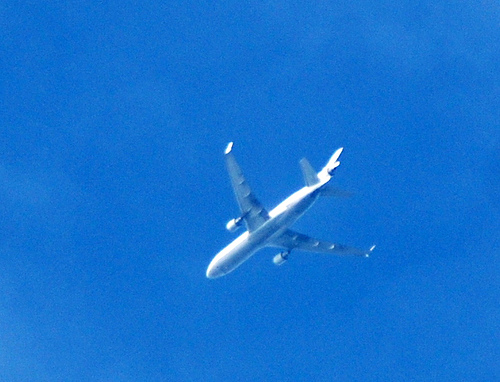

In [41]:
img_idx = 8

Image.open(img_files_train[img_idx])

In [42]:
img_kpts_xyz = torch.zeros((30,3), dtype=torch.double)
img_kpts_xyz[:] = torch.nan
img_kpts_xyz[kpt_xyz_with_indices[img_idx][:,3],:] = torch.from_numpy(kpt_xyz_with_indices[img_idx][:,:3])

img_kpts_xyz_mean = torch.mean(torch.from_numpy(kpt_xyz_with_indices[img_idx][:,:3]), dim=0)

xyz_candidates = img_kpts_xyz_mean[None,:] + torch.from_numpy(create_cube_grid(1, 100)).double()

# total_log_likelihood_angle, total_log_likelihood_ratio, total_length, angles, ratios, mask = kpt_energy(
#     xyz_candidates,
#     img_kpts_xyz,
#     torch.from_numpy(kpt_angles_mean),
#     torch.from_numpy(kpt_angles_std),
#     torch.from_numpy(kpt_ratios_mean),
#     torch.from_numpy(kpt_ratios_std)
# )

total_energy = kpt_energy_v2(
    xyz_candidates,
    img_kpts_xyz,
    torch.from_numpy(kpt_angles_mean),
    torch.from_numpy(kpt_angles_std),
    torch.from_numpy(kpt_ratios_mean),
    torch.from_numpy(kpt_ratios_std),
    [],
    [0,1,2,3,22,23,24]
)




In [43]:
res_kpt_xyz_all = []
for q_kpt_idx in [0,1,2,3,22,23,24]:
    # res_kpt = torch.argmax(2*total_log_likelihood_angle[:,q_kpt_idx] + total_log_likelihood_ratio[:,q_kpt_idx])
    res_kpt = torch.argmin(total_energy[:,q_kpt_idx])
    res_kpt_xyz = xyz_candidates[res_kpt]
    res_kpt_xyz_all.append(res_kpt_xyz)
res_kpt_xyz_all = torch.stack(res_kpt_xyz_all, dim=0)

In [35]:
res_kpt_xyz_all

tensor([[-0.2456, -0.0312,  0.2601],
        [-0.2254, -0.1524,  0.2399],
        [-0.1547, -0.1423,  0.2601],
        [-0.1547,  0.0699,  0.2298],
        [ 0.2897, -0.3039,  0.0580],
        [ 0.4413, -0.3948,  0.0682],
        [ 0.4009, -0.1221,  0.1490]], dtype=torch.float64)

In [44]:

fig = go.Figure(data=[
    # go.Volume(
    #     x=xyz_candidates[:,0],
    #     y=xyz_candidates[:,1],
    #     z=xyz_candidates[:,2],
    #     value=total_log_likelihood_angle[:,q_kpt_idx] + total_log_likelihood_ratio[:,q_kpt_idx],
    #     # isomin=0.1,
    #     # isomax=0.8,
    #     opacity=0.1, # needs to be small to see through all surfaces
    #     surface_count=50, # needs to be a large number for good volume rendering
    # ),
    go.Scatter3d(
        x=kpt_xyz_with_indices[img_idx][:,:3][:,0], 
        y=kpt_xyz_with_indices[img_idx][:,:3][:,1], 
        z=kpt_xyz_with_indices[img_idx][:,:3][:,2],
        mode='markers',
        marker=dict(
            size=6,
            color="red",                # set color to an array/list of desired values
            # colorscale='Viridis',   # choose a colorscale
            # opacity=0.8
        )
    ),
    go.Scatter3d(
        x=xyz_train[img_idx].reshape((-1,3))[:,0], 
        y=xyz_train[img_idx].reshape((-1,3))[:,1], 
        z=xyz_train[img_idx].reshape((-1,3))[:,2],
        mode='markers',
        marker=dict(
            size=1,
            color="blue",                # set color to an array/list of desired values
            # colorscale='Viridis',   # choose a colorscale
            opacity=0.8
        )
    ),
    go.Scatter3d(
        x=res_kpt_xyz_all[:,0], 
        y=res_kpt_xyz_all[:,1], 
        z=res_kpt_xyz_all[:,2],
        mode='markers',
        marker=dict(
            size=10,
            color=[[1,0,0],[0,1,0],[0,0,1],[1,1,0],[1,0,1],[0,1,1],[1,1,1]],                # set color to an array/list of desired values
            # colorscale='Viridis',   # choose a colorscale
            opacity=1
        )
    ),
])
fig.show()

In [31]:
xyz_train[img_idx].shape

(333, 500, 3)